# Frequency NGRAMS -  Chapbooks printed in Scotland


The key here is to have a look at what we are getting with the track of each individual series - by plotting  the mention of each term over time - giving them each individual term a line in the graph. So we can see if the use of terms changes over time. 

Data can be downloaded from: https://data.nls.uk/data/digitised-collections/chapbooks-printed-in-scotland/


### Loading the necessary libraries

In [1]:
import yaml
import matplotlib.pyplot as plt
import numpy as np
import collections
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
NON_AZ_REGEXP = re.compile('[^a-z]')

In [2]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']=200

### Functions

In [3]:
def normalize(word):
    """
    Normalize a word by converting it to lower-case and removing all
    characters that are not 'a',...,'z'.
    :param word: Word to normalize
    :type word: str or unicode
    :return: normalized word
    :rtype word: str or unicode
    """
    return re.sub(NON_AZ_REGEXP, '', word.lower())

In [4]:
def lemmatize(word):
    """
    Lemmatize a word, using a lexical knowledge bases to get the
    correct base forms of a word.
    Like stemming, lemmatization reduces inflectional forms to a
    common base form. As opposed to stemming, lemmatization does not
    simply chop off inflections. Instead it uses lexical knowledge
    bases to get the correct base forms of words.
    :param word: Word to normalize
    :type word: str or unicode
    :return: normalized word
    :rtype word: str or unicode
    """
    lemmatizer = WordNetLemmatizer()
    return lemmatizer.lemmatize(word)

In [5]:
def freq_count(results):
    freq_count={}
    for year in results:
        if year!= None:
            for i in results[year]:
                if i[0] not in freq_count:
                    freq_count[i[0]]={}
                    freq_count[i[0]][year]=i[1]
                
                else:
                    if year not in freq_count[i[0]]:
                        freq_count[i[0]][year]=i[1]
                    else:    
                        freq_count[i[0]][year]+=i[1]
    return freq_count

In [6]:
def normalize_freq(publication, freq_results, view_terms):
    plt.figure(figsize=(20,8))
    years=set()
    for term in view_terms:
        if term in freq_results:
            normed_results = {}
            for year in freq_results[term]:
                #print(year)
                if year!= None:
                    normed_results[year] = (freq_results[term][year]* len(term.split()))/float(publication[year][2])
                    years.add(year)
            plt.plot(*zip(*sorted(normed_results.items())), label=term, lw = 2, alpha = 1, marker="X")
    x_years=sorted(list(years))
    plt.xticks(np.arange(min(x_years), max(x_years)+1, 2.0), rotation=45) 
    plt.ticklabel_format(style = 'plain')
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.legend(loc='upper left')
    plt.xlabel("Years")
    plt.ylabel("Normalized Frequency")
    plt.show()       

In [7]:
def read_query_results(filename):
    with open('./results_ChapBooks/'+filename, 'r') as f:
        query_results = yaml.load(f)
    return query_results


In [8]:
def plot_freq_count(freq_results, view_terms):
    plt.figure(figsize=(20,8))
    years=set()
    for term in view_terms:
        if term in freq_results:
            plt.plot(*zip(*sorted(freq_results[term].items())), label=term, lw = 2, alpha = 1, marker="X")
            for y in freq_results[term].keys(): 
                years.add(y)     
    x_years=sorted(list(years))
    plt.xticks(np.arange(min(x_years), max(x_years)+1, 2.0), rotation=45) 
    plt.ticklabel_format(style = 'plain')
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.legend(loc='upper left')
    plt.ylabel('Frequency')
    plt.xlabel("Years")
    plt.show()

In [9]:
def plot_norm(publication, element):
    plt.figure(figsize=(20,8))
    num_element={}
    years=set()
    for year in publication:
        if element == "words":
            num_element[year]=publication[year][2]
        elif element == "pages":
            num_element[year]=publication[year][1]
        else:
            num_element[year]=publication[year][0]
        years.add(year)  
    plt.plot(*zip(*sorted(num_element.items())), label=element, lw = 2, alpha = 1, marker="X")
    x_years=sorted(list(years))
    plt.xticks(np.arange(min(x_years), max(x_years)+1, 2.0), rotation=45) 
    plt.ticklabel_format(style = 'plain')
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.legend(loc='upper left')
    plt.ylabel('Number of ' + element + 'per book')
    plt.xlabel("Years")

    plt.show()
    return num_element, years

## 1. Normalised Query

First we examine the total number of issues, articles and words published over the period to see how much our search terms are affected by the way that published increases over the measurement period.

The query return the results in this format:

    {
      <YEAR>: [<NUM_BOOKS>, <NUM_PAGES>, <NUM_WORDS>],
      ...
    }

In [10]:
norm_publication=read_query_results('normalize_results')

#for printing the values, we are going to sort the values 
# by the years and just visualizing the first 10 years . 
#e.g --> 1792 year, with 1 book, 8 pages, and 2663 words. 
#e.g --> 1793 year, with 9 books , 152 pages and 31247 words.

# Note, that there is 13 books for which we dont have the year.
# None: [13, 214, 60320] --> 13 books, 214 pages, 60320 words


norm_publication
#sorted(norm_publication.items())[:]

/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


{None: [13, 214, 60320],
 1792: [1, 8, 2663],
 1793: [9, 152, 31247],
 1794: [7, 112, 30062],
 1795: [38, 808, 202388],
 1796: [4, 48, 10627],
 1797: [7, 100, 26785],
 1798: [14, 248, 51624],
 1799: [45, 732, 203239],
 1800: [258, 3576, 833481],
 1801: [43, 700, 199862],
 1802: [98, 956, 201144],
 1803: [34, 486, 110587],
 1804: [38, 518, 106816],
 1805: [16, 248, 60134],
 1806: [33, 614, 176796],
 1807: [16, 326, 90804],
 1808: [14, 282, 73660],
 1809: [13, 248, 74123],
 1810: [93, 1624, 347312],
 1811: [17, 328, 77831],
 1812: [34, 488, 116382],
 1813: [113, 1792, 338126],
 1814: [16, 176, 31371],
 1815: [224, 2542, 486661],
 1816: [98, 988, 171524],
 1817: [64, 900, 203342],
 1818: [23, 386, 74376],
 1819: [25, 528, 99729],
 1820: [168, 2546, 523418],
 1821: [30, 500, 116308],
 1822: [37, 666, 162692],
 1823: [84, 990, 184090],
 1824: [25, 292, 56757],
 1825: [92, 946, 163775],
 1826: [36, 450, 85851],
 1827: [29, 616, 153656],
 1828: [68, 1394, 354178],
 1829: [20, 256, 59042],
 18

In order to set the scene and visualize how the issues, articles and words grew over the time, we are going to plot three basic graphs:        
- number of books over time per year
- number of pages over time per year
- number of words over time per year

However, we need to exclude the 13 books which we do not have year - "Gather with None Key". 
This new dictionary will be called "norm_publication2", which we will use in the rest of this notebook. 
      

In [11]:
invalid = {None}
def without_keys(d, keys):
    return {x: d[x] for x in d if x not in keys}

norm_publication2=without_keys(norm_publication, invalid)

In [12]:
norm_publication2

{1792: [1, 8, 2663],
 1793: [9, 152, 31247],
 1794: [7, 112, 30062],
 1795: [38, 808, 202388],
 1796: [4, 48, 10627],
 1797: [7, 100, 26785],
 1798: [14, 248, 51624],
 1799: [45, 732, 203239],
 1800: [258, 3576, 833481],
 1801: [43, 700, 199862],
 1802: [98, 956, 201144],
 1803: [34, 486, 110587],
 1804: [38, 518, 106816],
 1805: [16, 248, 60134],
 1806: [33, 614, 176796],
 1807: [16, 326, 90804],
 1808: [14, 282, 73660],
 1809: [13, 248, 74123],
 1810: [93, 1624, 347312],
 1811: [17, 328, 77831],
 1812: [34, 488, 116382],
 1813: [113, 1792, 338126],
 1814: [16, 176, 31371],
 1815: [224, 2542, 486661],
 1816: [98, 988, 171524],
 1817: [64, 900, 203342],
 1818: [23, 386, 74376],
 1819: [25, 528, 99729],
 1820: [168, 2546, 523418],
 1821: [30, 500, 116308],
 1822: [37, 666, 162692],
 1823: [84, 990, 184090],
 1824: [25, 292, 56757],
 1825: [92, 946, 163775],
 1826: [36, 450, 85851],
 1827: [29, 616, 153656],
 1828: [68, 1394, 354178],
 1829: [20, 256, 59042],
 1830: [24, 310, 73960],
 18

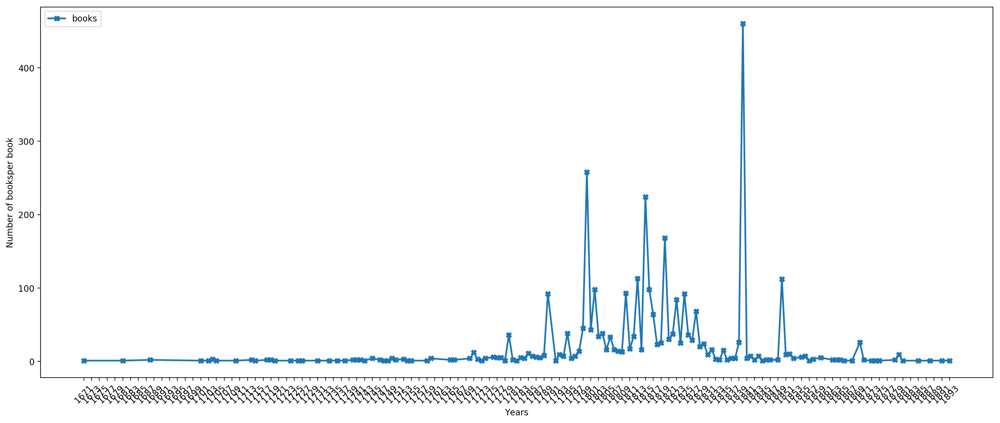

In [13]:
#Plot the variation of number of issues
num_issues, issues_years = plot_norm(norm_publication2, "books")


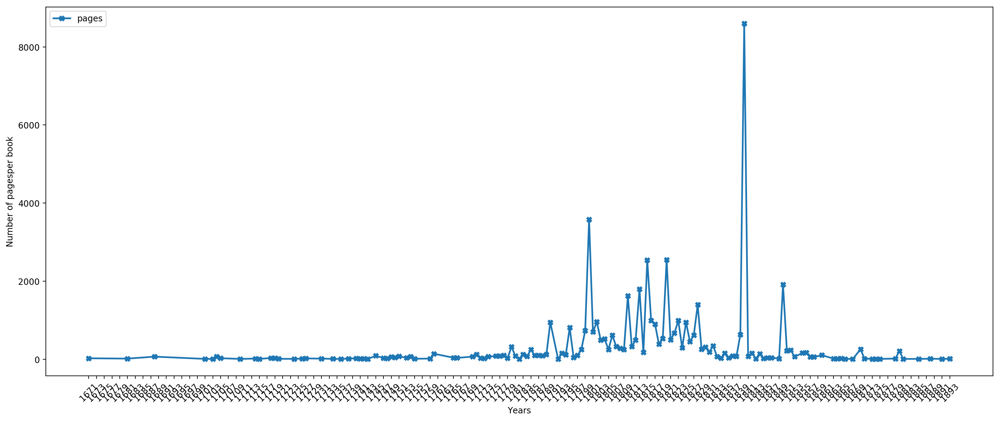

In [14]:
#Plot the variation of number of articles
num_articles, articles_years = plot_norm(norm_publication2, "pages")

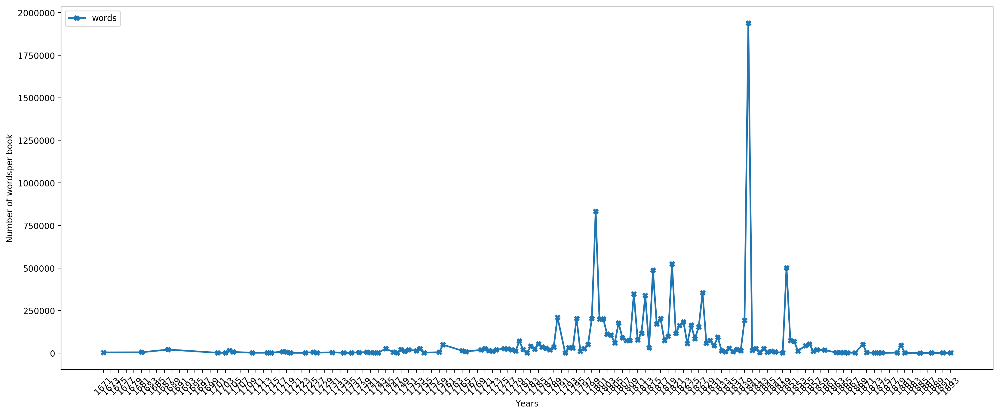

In [15]:
#Plot the variation of number of words 
num_words, words_years = plot_norm(norm_publication2, "words")

## 2. Distribution of terms over time

We count the total number of words per year, and then count total instances of each query's search terms in it. 

And then, we **plot normalised frequency** (by words) on a graph (x axis is years), to see whether a term is becoming more or less popular with time. 

Also, we have included the plots of the **raw frequencies** (without normalising the results)

All the words (query's search terms and ChapBooks words) have been **normalized** (lower case, and remove everything that is not a letter). 

**Query search terms - SCOTS LEXICON**: 
    - muckle, kail, powny, siller, de'il, ken, ane, aff, blaw, wha, maun, guid, jeedge, sekeerity, beis, nae, keerate, bigging, jeestice, mair, fat, beik, herry, auld, anent, gae, gaet, ae, sekeered, sume, cald, wad, mae, frae, fan, deen, meikle, buik, ca'd, bra', wark, awa', lang, oun, doun, stieking, byde, quhich, quhen, pouer, obtean, laizoure, nou, begg, complementare, flouer, goand, laird, laizour, quher, neu, nixt, somquhat, compleand, weel, deseases, specialityes, specialitye, floues, cleanging, quhatever, allou, conteaned, thir, scarr, neuse, vacance, throu, moe, attean, tye, reneuing, deepth, deuty, reinge, thrid, vocables, vocable, barrous, refeir, theick, keept, lairds, laird, Shirriff, demitt, keep’t, writt, wrott, necessar , alltogather, to gather, wrot, clog bag, tost, wrot, dimitt, forfault, forfaulting, plaisture, treater, treaters, allayance, intierlie, intier, thos, Saturnday, sederunt, pairties, intire, subscryved, prosecutione, subscryve, guaird, guairds, Lewtennant, pairt, pairted, lyke, caise, macer, macers, sowme, evite, evited, declairing, declair, debeat, praeventing, praevent, compleang, complean, mantain, dail, quhatsomever, pairtners, pairtner, wreat, pairtie, plausabile, tread, regaird, treatters, shoar, ashoar, Thesaury, wreating, qhereas, Captane, reponed, repone, wreats, neaver, nynteinth, guaird, guairds, judiccatories, judicatory, weal, necessaire, unecessaire, ingadged , ingadge, aneugh, laitlie, praejudge, Thrasurie, grive, grived, praesant, Greace, gaird, Hylander, Hyland, blist, hender, henders, praesum, brok, mainie, weal, cheange, cheangablness, exhousted, praejudice, cheanges, hendred, praeside, caice, glaid, lou, praelimiting, dail, unanimuslie, prelimitation, prelimit, necessitat , adoeing, dale, rexive, quytt, clame, ffermers, approwen, quhereby, choise, to morou, Thraesurie, esteat, cariing , esteats, interteanment, intertean, interteanments, niu, diu, haist, spair, daile, saime, larne, saife, saif, cabaling, repulls, verrie, haisty, therteen, suord, daited, dait, vottes, votte, Estaites, miet, relaite, relaites, ordinar, ether, Jully, commissariat, obteaning, obteaned, obteane, acquent, Juin, Juine, hir, continowance, continow, sume, lykewayes, continow, dischairge, cane, contraire, debait, pairting, pairty, subscrive, subscrives, Justiciorie, lauer, prorogation, poure, naruly, lykways, weell


    
**Note**: Since we have a high number of search terms (278), we have divided them in **28 taxonomies**, in order to improve visualizations. 

In [16]:
lexicon_string='muckle, kail, powny, siller, deil, ken, ane, aff, blaw, wha, maun, guid, jeedge, sekeerity, beis, nae, keerate, bigging, jeestice, mair, fat, beik, herry, auld, anent, gae, gaet, ae, sekeered, sume, cald, wad, mae, frae, fan, deen, meikle, buik, cad, bra, wark, awa, lang, oun, doun, stieking, byde, quhich, quhen, pouer, obtean, laizoure, nou, begg, complementare, flouer, goand, laird, laizour, quher, neu, nixt, somquhat, compleand, weel, deseases, specialityes, specialitye, floues, cleanging, quhatever, allou, conteaned, thir, scarr, neuse, vacance, throu, moe, attean, tye, reneuing, deepth, deuty, reinge, thrid, vocables, vocable, barrous, refeir, theick, keept, lairds, laird, Shirriff, demitt, keep’t, writt, wrott, necessar , alltogather, to gather, wrot, clog bag, tost, wrot, dimitt, forfault, forfaulting, plaisture, treater, treaters, allayance, intierlie, intier, thos, Saturnday, sederunt, pairties, intire, subscryved, prosecutione, subscryve, guaird, guairds, Lewtennant, pairt, pairted, lyke, caise, macer, macers, sowme, evite, evited, declairing, declair, debeat, praeventing, praevent, compleang, complean, mantain, dail, quhatsomever, pairtners, pairtner, wreat, pairtie, plausabile, tread, regaird, treatters, shoar, ashoar, Thesaury, wreating, qhereas, Captane, reponed, repone, wreats, neaver, nynteinth, guaird, guairds, judiccatories, judicatory, weal, necessaire, unecessaire, ingadged , ingadge, aneugh, laitlie, praejudge, Thrasurie, grive, grived, praesant, Greace, gaird, Hylander, Hyland, blist, hender, henders, praesum, brok, mainie, weal, cheange, cheangablness, exhousted, praejudice, cheanges, hendred, praeside, caice, glaid, lou, praelimiting, dail, unanimuslie, prelimitation, prelimit, necessitat , adoeing, dale, rexive, quytt, clame, ffermers, approwen, quhereby, choise, to morou, Thraesurie, esteat, cariing , esteats, interteanment, intertean, interteanments, niu, diu, haist, spair, daile, saime, larne, saife, saif, cabaling, repulls, verrie, haisty, therteen, suord, daited, dait, vottes, votte, Estaites, miet, relaite, relaites, ordinar, ether, Jully, commissariat, obteaning, obteaned, obteane, acquent, Juin, Juine, hir, continowance, continow, sume, lykewayes, continow, dischairge, cane, contraire, debait, pairting, pairty, subscrive, subscrives, Justiciorie, lauer, prorogation, poure, naruly, lykways, weell'
lexicon= re.split('; |, |\*|\n',lexicon_string)
len(lexicon)

278

In [17]:
lexicon_norm=[]
for keysentence in lexicon:
    k_split = keysentence.split()
    sentence_word = [normalize(word) for word in k_split]
    sentence_norm = ''
    for word in sentence_word:
        if sentence_norm == '':
            sentence_norm = word
        else:
            sentence_norm += " " + word
    lexicon_norm.append(sentence_norm)

#### Taxomomy_1

In [18]:
print("Terms used in Taxonomy 1: %s" %(' '.join(lexicon_norm[0:10]).replace(' ', ', ')))

Terms used in Taxonomy 1: muckle, kail, powny, siller, deil, ken, ane, aff, blaw, wha


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


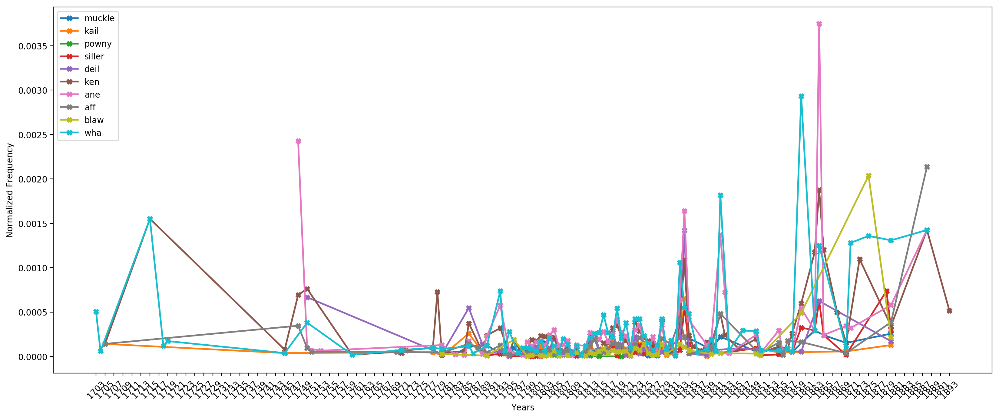

In [19]:
taxonomy_1= lexicon_norm[0:10]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_1
normalize_freq(norm_publication2, freq_count_norm, taxonomy_1)

####  Without normalising - Visualising the raw frequencies  of taxonomy 1

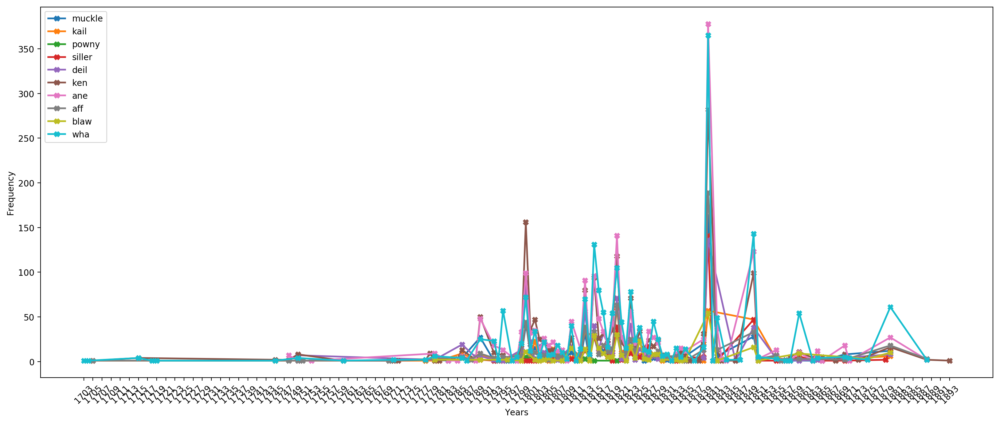

In [20]:
plot_freq_count(freq_count_norm, taxonomy_1)

#### Taxomomy_2:

In [21]:
print("Terms used in Taxonomy 2: %s" %(' '.join(lexicon_norm[10:20]).replace(' ', ', ')))

Terms used in Taxonomy 2: maun, guid, jeedge, sekeerity, beis, nae, keerate, bigging, jeestice, mair


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


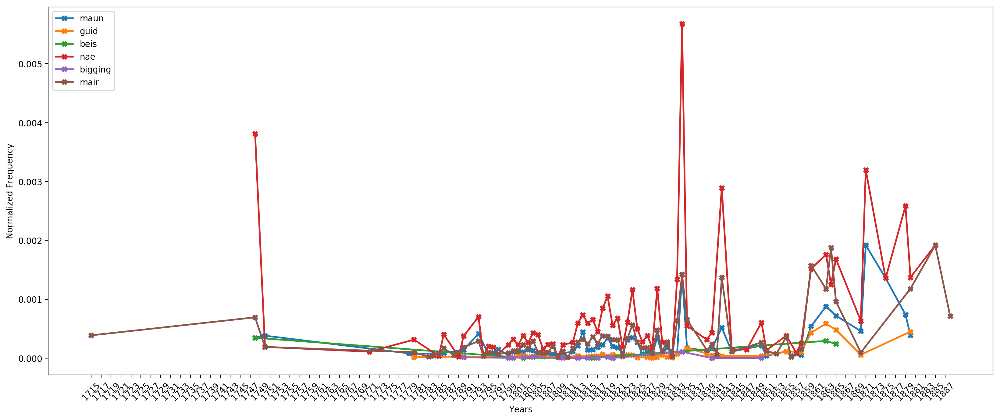

In [22]:
taxonomy_2= lexicon_norm[10:20]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_2
normalize_freq(norm_publication, freq_count_norm, taxonomy_2)

#### Without normalising - Visualising the raw frequencies of taxonomy 2

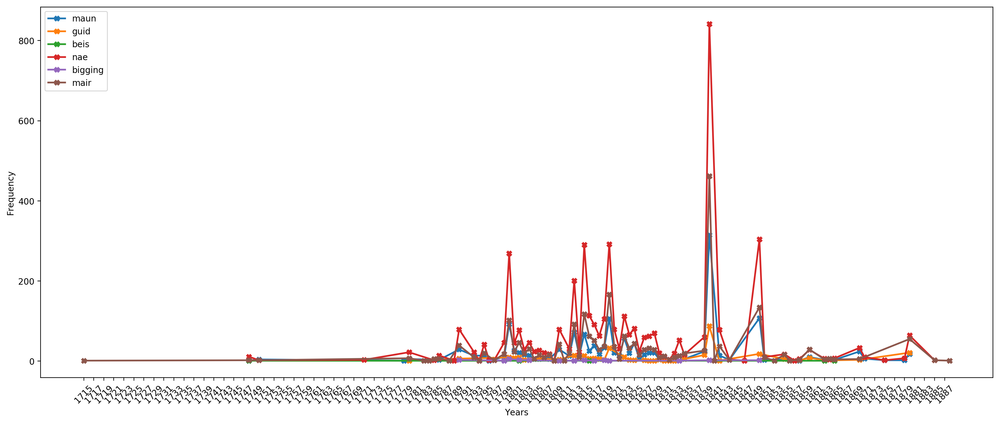

In [23]:
plot_freq_count(freq_count_norm, taxonomy_2)

#### Taxomomy_3

In [24]:
print("Terms used in Taxonomy 3: %s" %(' '.join(lexicon_norm[20:30]).replace(' ', ', ')))

Terms used in Taxonomy 3: fat, beik, herry, auld, anent, gae, gaet, ae, sekeered, sume


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


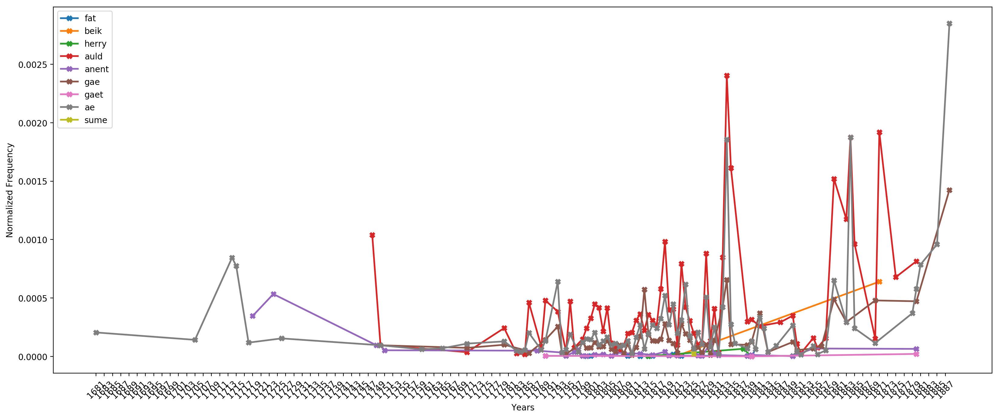

In [25]:
taxonomy_3= lexicon_norm[20:30]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_3
normalize_freq(norm_publication, freq_count_norm, taxonomy_3)

#### Without normalising - Visualising the raw frequencies of taxonomy 3

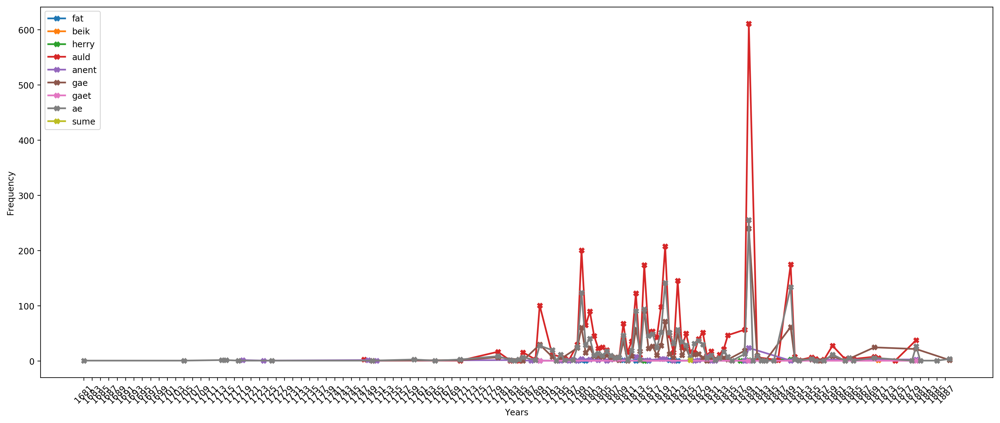

In [26]:
plot_freq_count(freq_count_norm, taxonomy_3)

#### Taxomomy_4

In [27]:
print("Terms used in Taxonomy 4: %s" %(' '.join(lexicon_norm[30:40]).replace(' ', ', ')))

Terms used in Taxonomy 4: cald, wad, mae, frae, fan, deen, meikle, buik, cad, bra


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


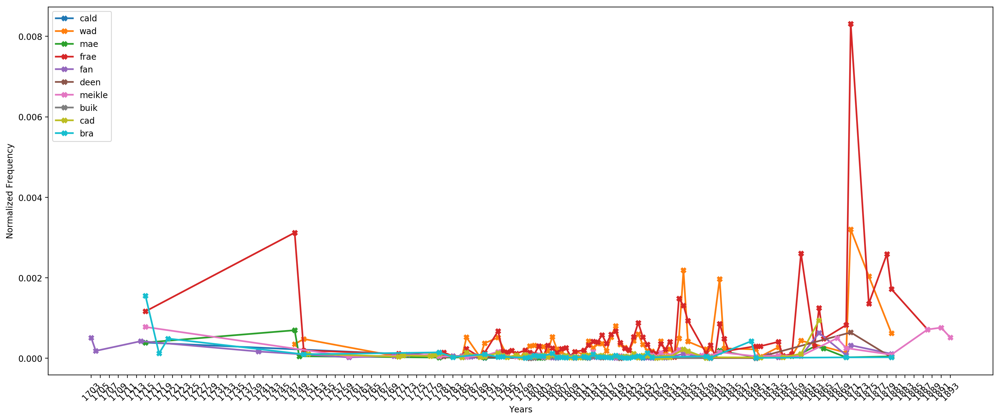

In [28]:
taxonomy_4= lexicon_norm[30:40]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_4
normalize_freq(norm_publication, freq_count_norm, taxonomy_4)

#### Without normalising - Visualising the raw frequencies of taxonomy 4

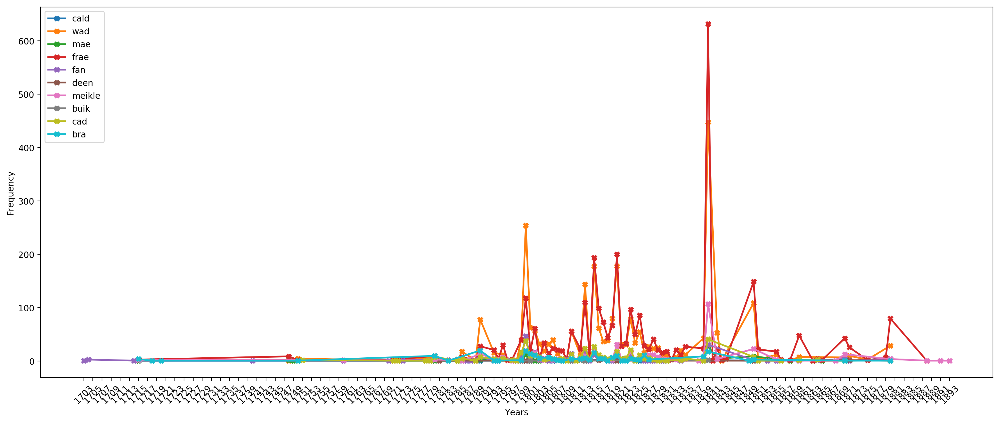

In [29]:
plot_freq_count(freq_count_norm, taxonomy_4)

#### Taxomomy_5

In [30]:
print("Terms used in Taxonomy 5: %s" %(' '.join(lexicon_norm[40:50]).replace(' ', ', ')))

Terms used in Taxonomy 5: wark, awa, lang, oun, doun, stieking, byde, quhich, quhen, pouer


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


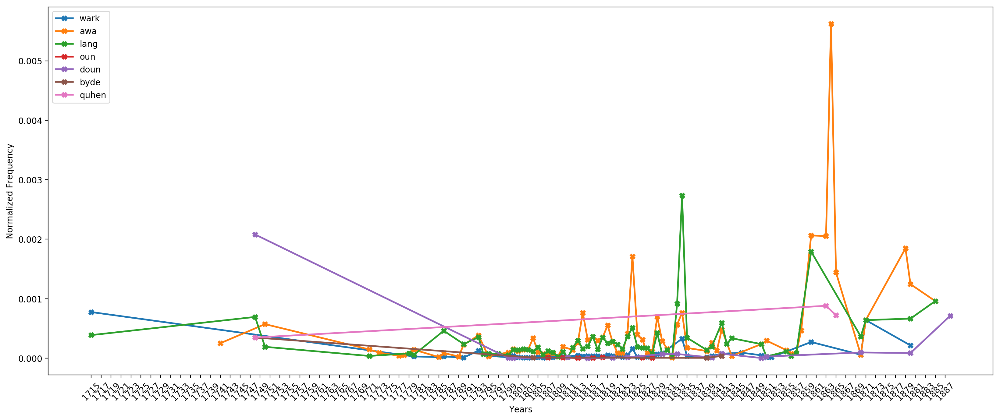

In [31]:
taxonomy_5= lexicon_norm[40:50]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_5
normalize_freq(norm_publication, freq_count_norm, taxonomy_5)

#### Without normalising - Visualising the raw frequencies of taxonomy 5

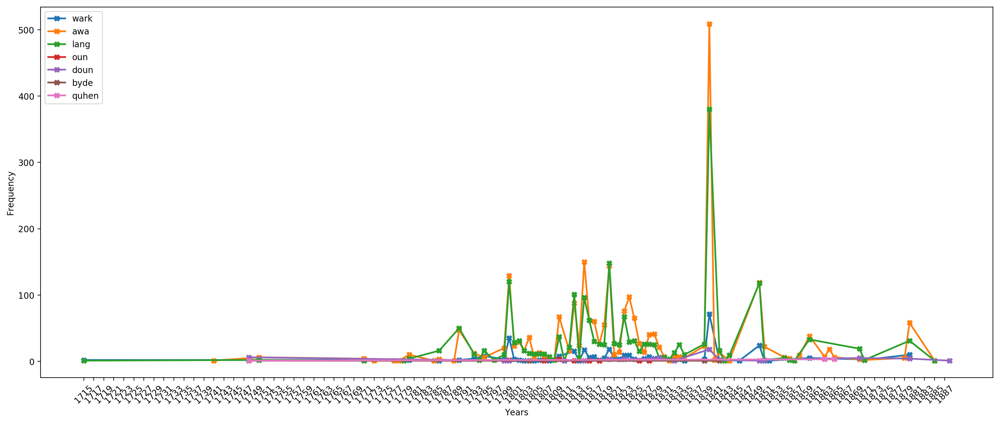

In [32]:
plot_freq_count(freq_count_norm, taxonomy_5)

#### Taxomony 6

In [33]:
print("Terms used in Taxonomy 6: %s" %(' '.join(lexicon_norm[50:60]).replace(' ', ', ')))

Terms used in Taxonomy 6: obtean, laizoure, nou, begg, complementare, flouer, goand, laird, laizour, quher


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


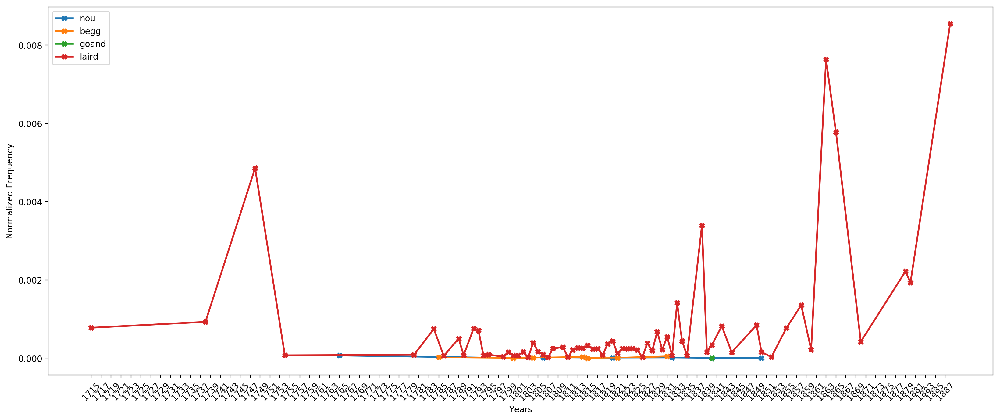

In [34]:
taxonomy_6= lexicon_norm[50:60]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_6
normalize_freq(norm_publication, freq_count_norm, taxonomy_6)

#### Without normalising - Visualising the raw frequencies of taxonomy 6

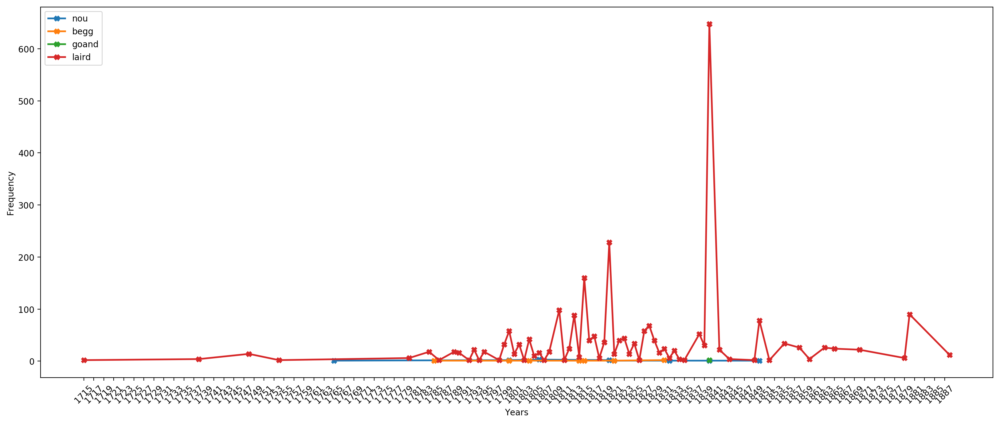

In [35]:
plot_freq_count(freq_count_norm, taxonomy_6)

#### Taxomony 7

In [36]:
print("Terms used in Taxonomy 7: %s" %(' '.join(lexicon_norm[60:70]).replace(' ', ', ')))

Terms used in Taxonomy 7: neu, nixt, somquhat, compleand, weel, deseases, specialityes, specialitye, floues, cleanging


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


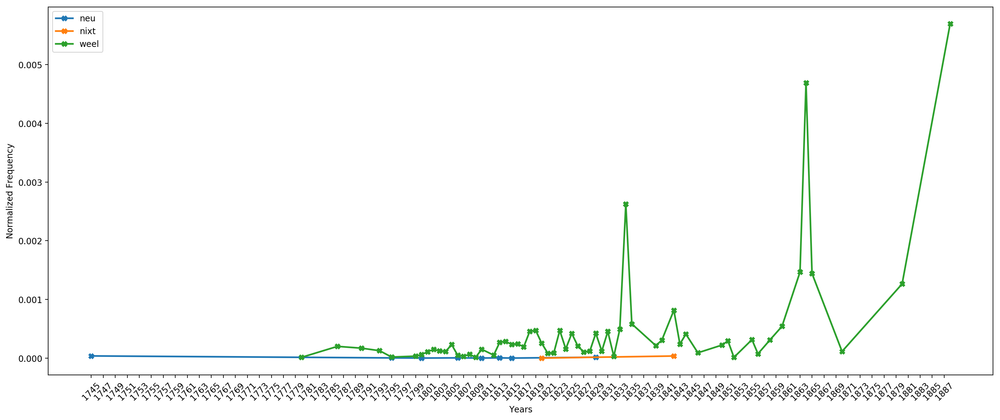

In [37]:
taxonomy_7= lexicon_norm[60:70]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_7
normalize_freq(norm_publication, freq_count_norm, taxonomy_7)

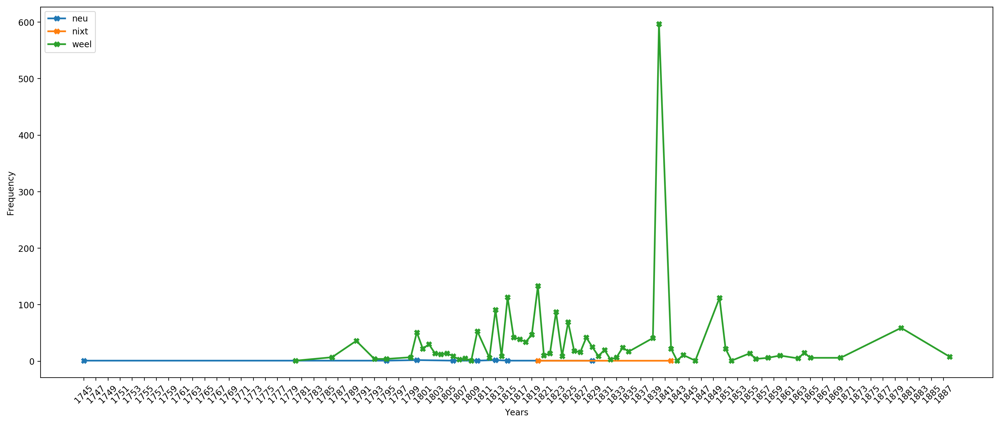

In [38]:
plot_freq_count(freq_count_norm, taxonomy_7)

#### Taxomony 8

In [39]:
print("Terms used in Taxonomy 8: %s" %(' '.join(lexicon_norm[70:80]).replace(' ', ', ')))

Terms used in Taxonomy 8: quhatever, allou, conteaned, thir, scarr, neuse, vacance, throu, moe, attean


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


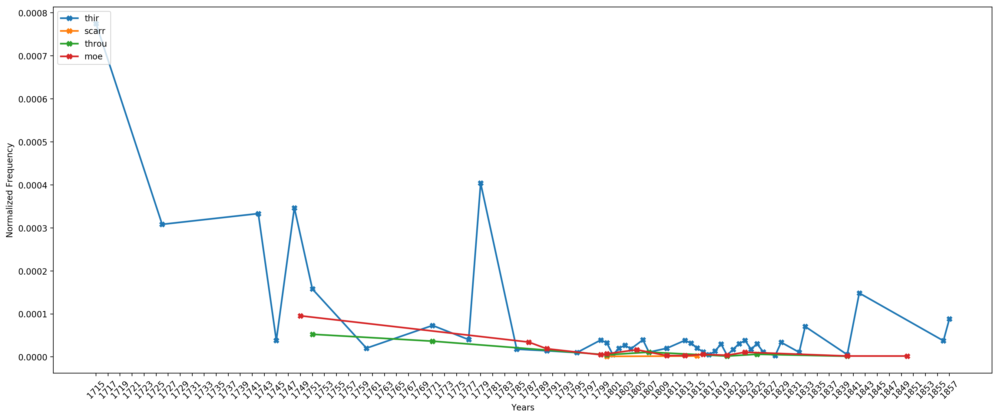

In [40]:
taxonomy_8= lexicon_norm[70:80]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_8
normalize_freq(norm_publication, freq_count_norm, taxonomy_8)

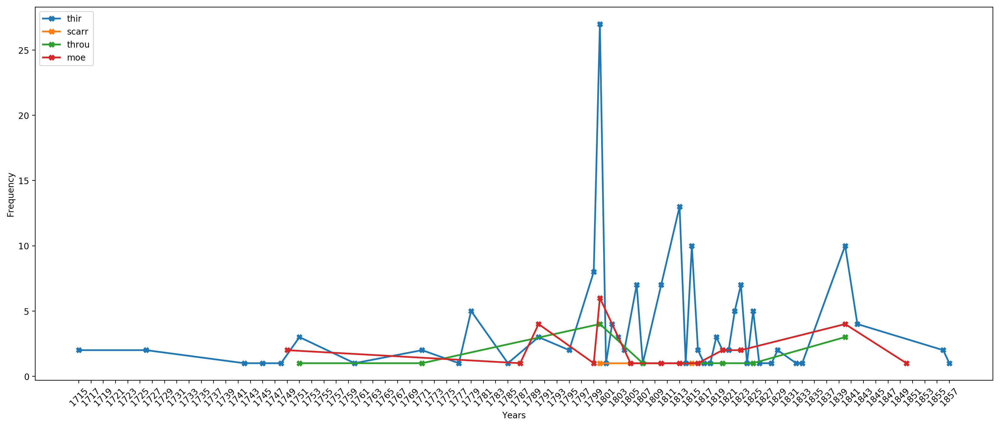

In [41]:
plot_freq_count(freq_count_norm, taxonomy_8)

#### Taxomony 9

In [42]:
print("Terms used in Taxonomy 9: %s" %(' '.join(lexicon_norm[80:90]).replace(' ', ', ')))

Terms used in Taxonomy 9: tye, reneuing, deepth, deuty, reinge, thrid, vocables, vocable, barrous, refeir


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


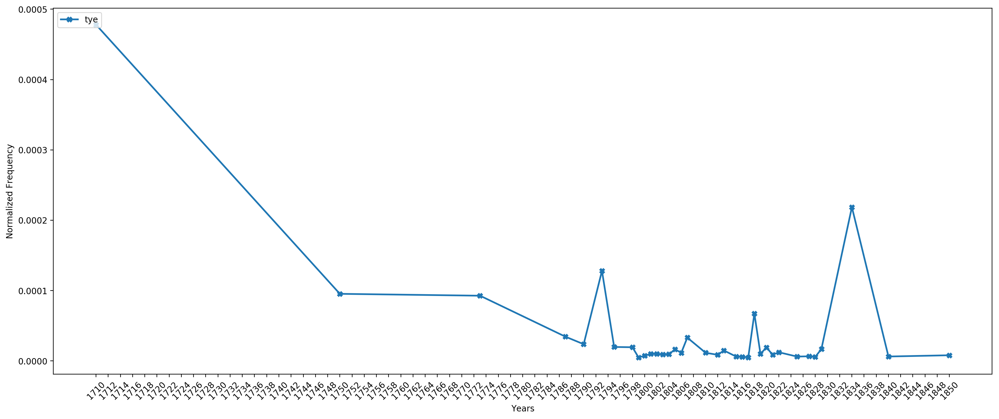

In [43]:
taxonomy_9= lexicon_norm[80:90]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_9
normalize_freq(norm_publication, freq_count_norm, taxonomy_9)

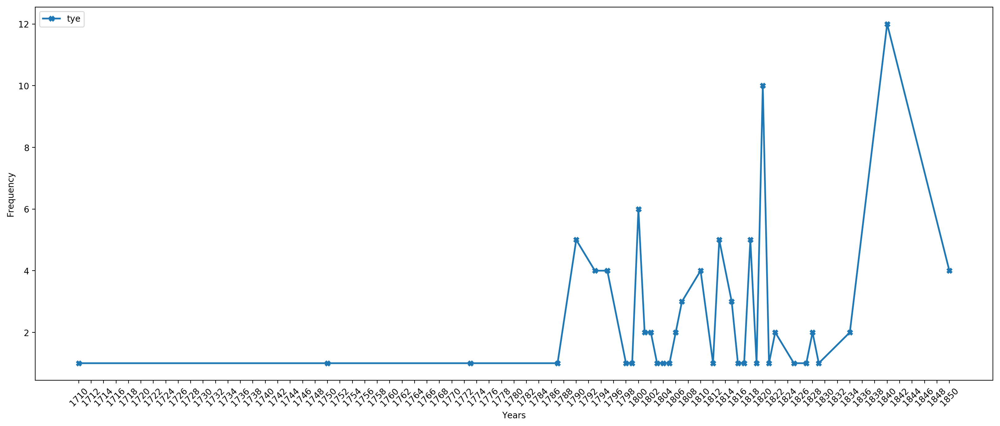

In [44]:
plot_freq_count(freq_count_norm, taxonomy_9)

#### Taxomony 10

In [45]:
print("Terms used in Taxonomy 10: %s" %(' '.join(lexicon_norm[90:100]).replace(' ', ', ')))

Terms used in Taxonomy 10: theick, keept, lairds, laird, shirriff, demitt, keept, writt, wrott, necessar


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


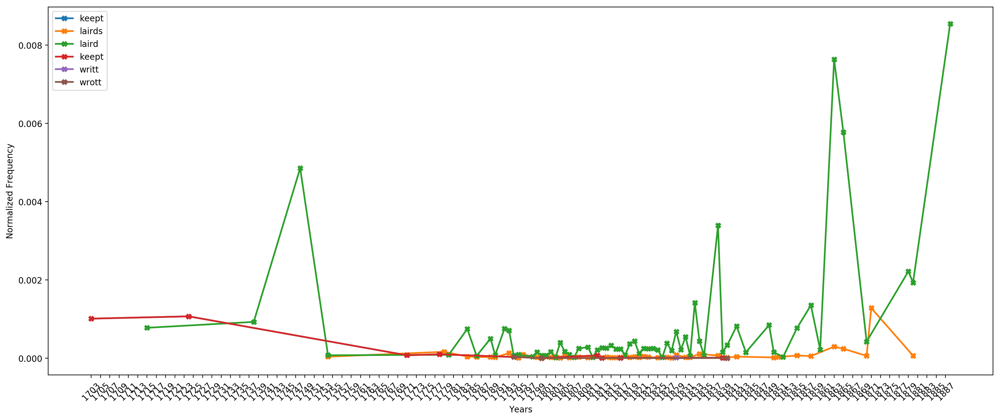

In [46]:
taxonomy_10= lexicon_norm[90:100]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_10
normalize_freq(norm_publication, freq_count_norm, taxonomy_10)

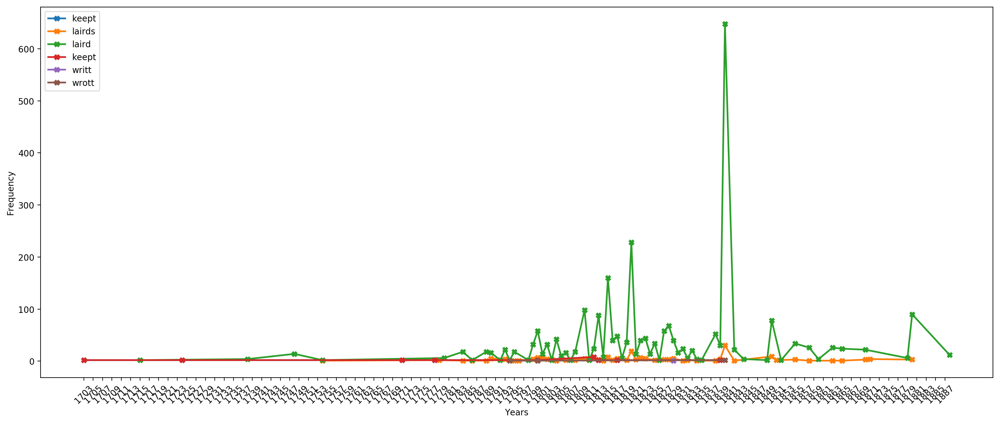

In [47]:
plot_freq_count(freq_count_norm, taxonomy_10)

#### Taxomony 11

In [48]:
print("Terms used in Taxonomy 11: %s" %(' '.join(lexicon_norm[100:110]).replace(' ', ', ')))

Terms used in Taxonomy 11: alltogather, to, gather, wrot, clog, bag, tost, wrot, dimitt, forfault, forfaulting, plaisture


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


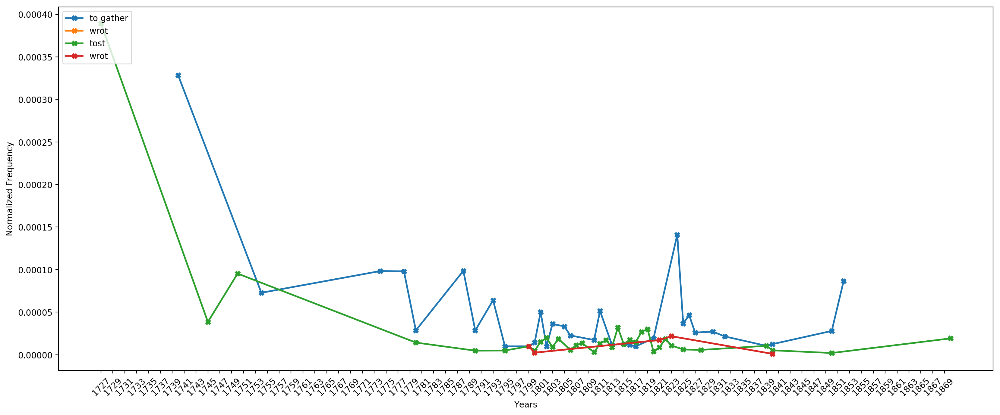

In [49]:
taxonomy_11= lexicon_norm[100:110]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_11
normalize_freq(norm_publication, freq_count_norm, taxonomy_11)

#### Taxomony 12

In [50]:
print("Terms used in Taxonomy 12: %s" %(' '.join(lexicon_norm[110:120]).replace(' ', ', ')))

Terms used in Taxonomy 12: treater, treaters, allayance, intierlie, intier, thos, saturnday, sederunt, pairties, intire


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


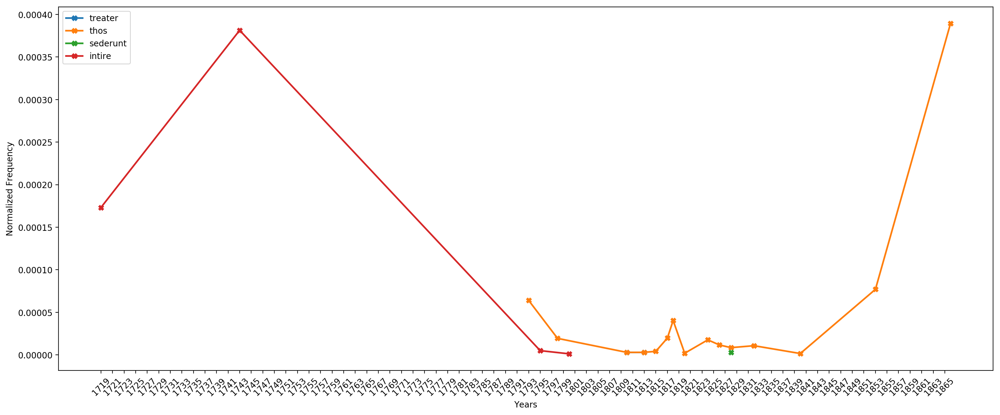

In [51]:
taxonomy_12= lexicon_norm[110:120]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_12
normalize_freq(norm_publication, freq_count_norm, taxonomy_12)

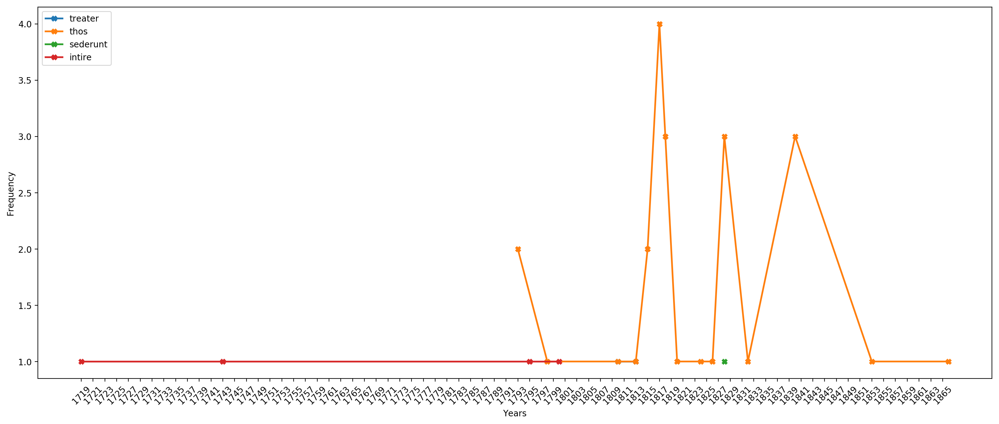

In [52]:
plot_freq_count(freq_count_norm, taxonomy_12)

#### Taxomony 13

In [53]:
print("Terms used in Taxonomy 13: %s" %(' '.join(lexicon_norm[120:130]).replace(' ', ', ')))

Terms used in Taxonomy 13: subscryved, prosecutione, subscryve, guaird, guairds, lewtennant, pairt, pairted, lyke, caise


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


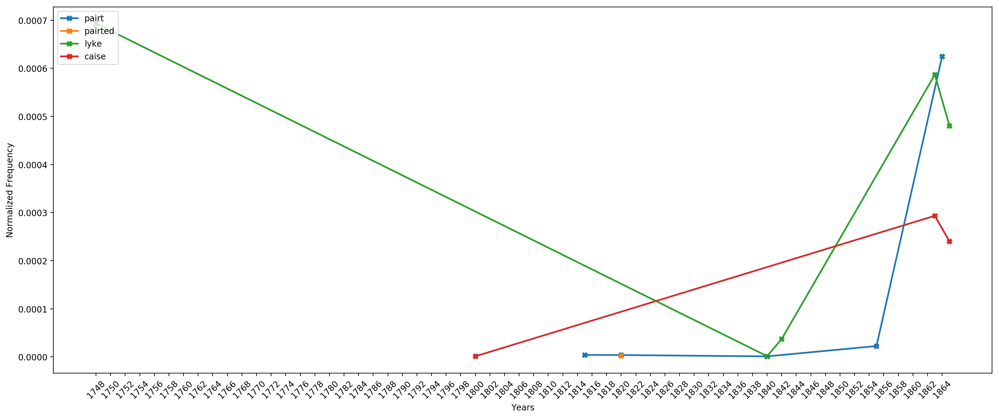

In [54]:
taxonomy_13= lexicon_norm[120:130]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_13
normalize_freq(norm_publication, freq_count_norm, taxonomy_13)

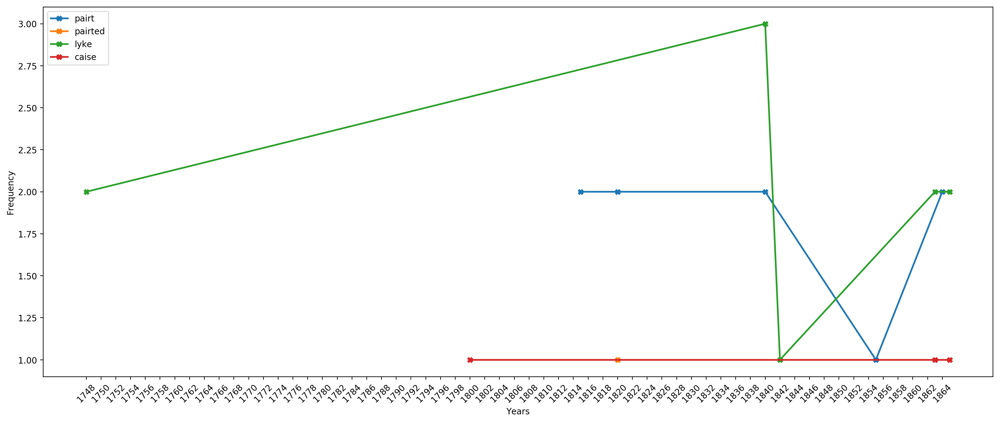

In [55]:
plot_freq_count(freq_count_norm, taxonomy_13)

#### Taxomony 14

In [56]:
print("Terms used in Taxonomy 14: %s" %(' '.join(lexicon_norm[130:140]).replace(' ', ', ')))

Terms used in Taxonomy 14: macer, macers, sowme, evite, evited, declairing, declair, debeat, praeventing, praevent


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


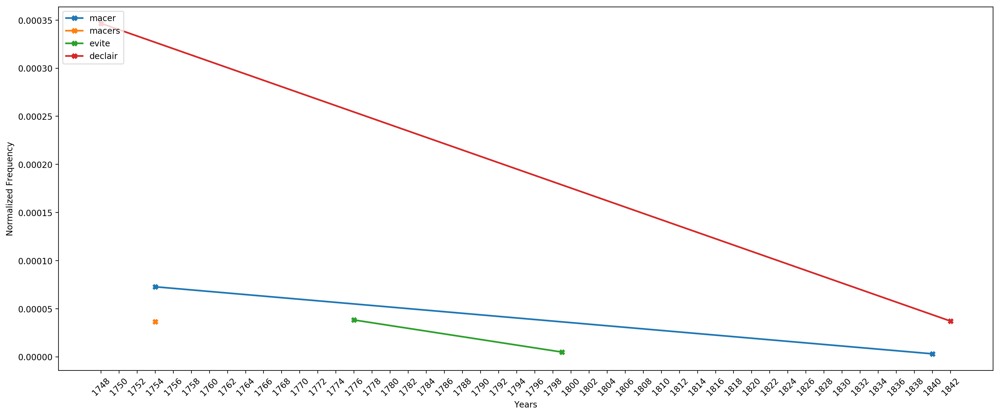

In [57]:
taxonomy_14= lexicon_norm[130:140]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_14
normalize_freq(norm_publication, freq_count_norm, taxonomy_14)

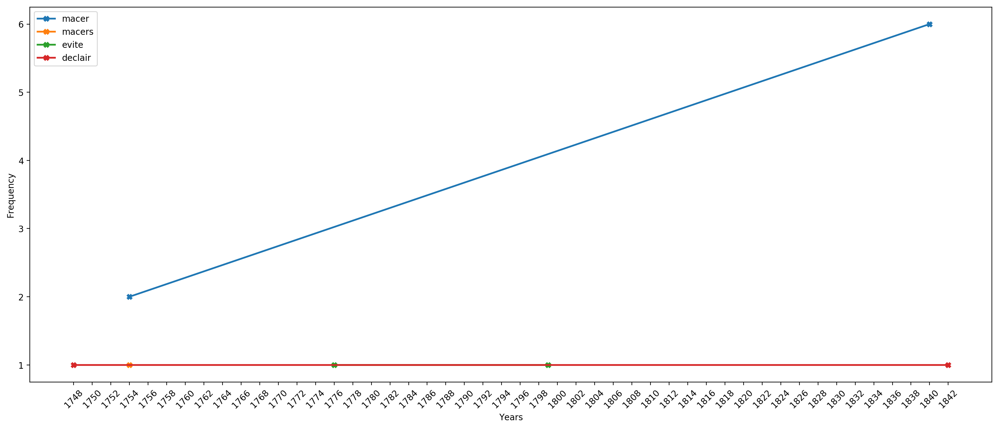

In [58]:
plot_freq_count(freq_count_norm, taxonomy_14)

#### Taxomony 15

In [59]:
print("Terms used in Taxonomy 15: %s" %(' '.join(lexicon_norm[140:150]).replace(' ', ', ')))

Terms used in Taxonomy 15: compleang, complean, mantain, dail, quhatsomever, pairtners, pairtner, wreat, pairtie, plausabile


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


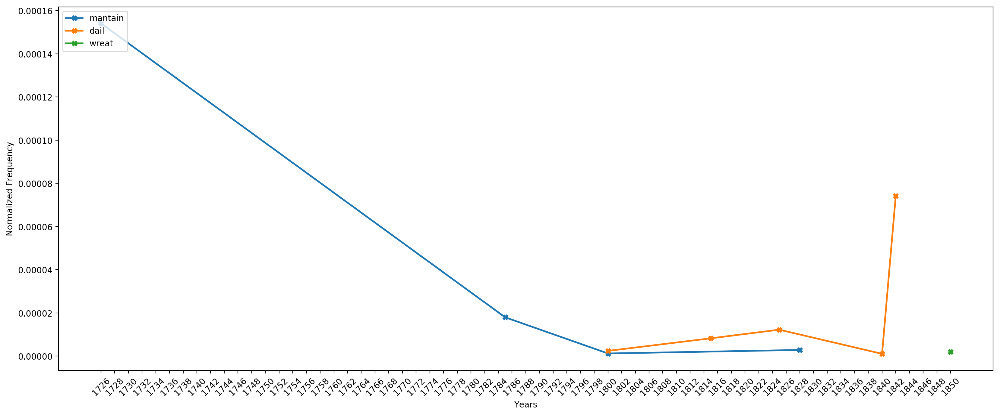

In [60]:
taxonomy_15= lexicon_norm[140:150]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_15
normalize_freq(norm_publication, freq_count_norm, taxonomy_15)

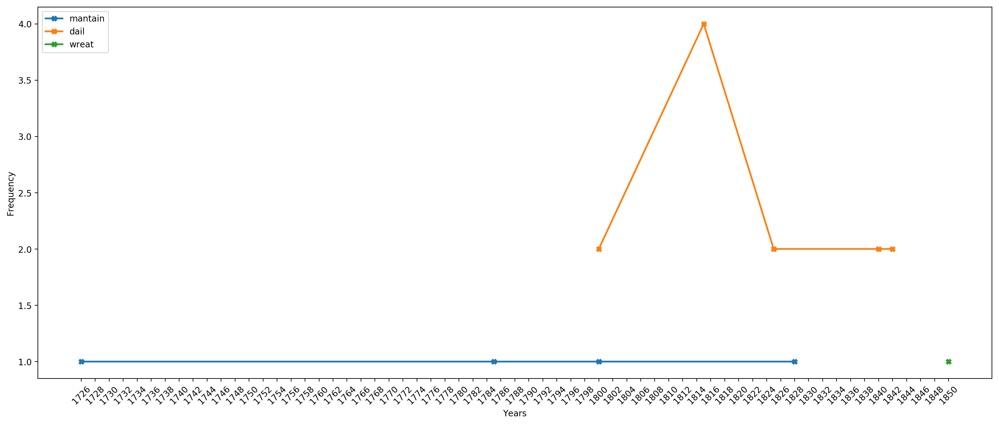

In [61]:
plot_freq_count(freq_count_norm, taxonomy_15)

#### Taxomony 16

In [62]:
print("Terms used in Taxonomy 16: %s" %(' '.join(lexicon_norm[150:160]).replace(' ', ', ')))

Terms used in Taxonomy 16: tread, regaird, treatters, shoar, ashoar, thesaury, wreating, qhereas, captane, reponed


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


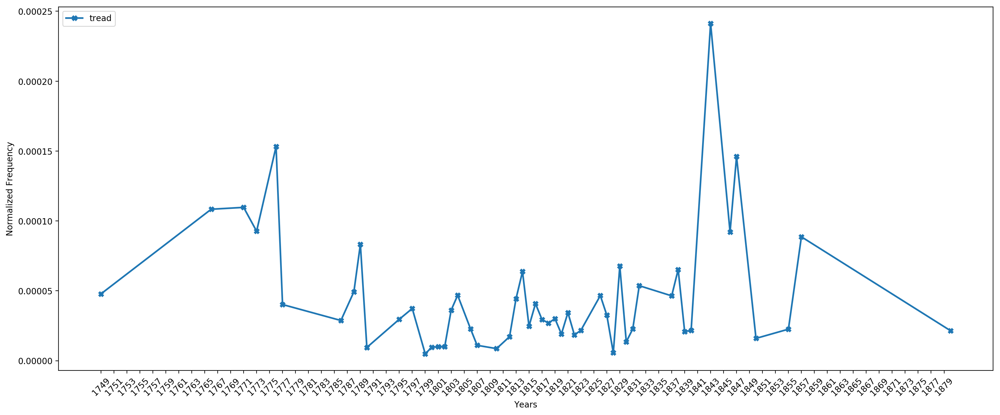

In [63]:
taxonomy_16= lexicon_norm[150:160]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_16
normalize_freq(norm_publication, freq_count_norm, taxonomy_16)

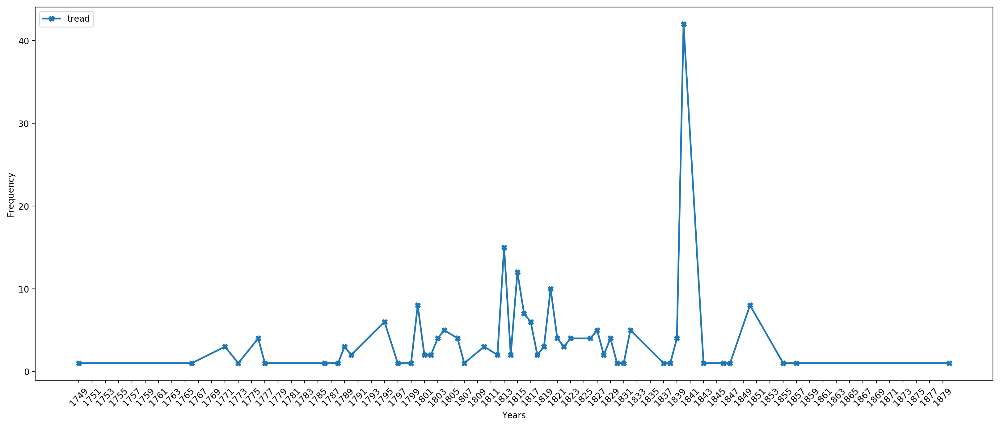

In [64]:
plot_freq_count(freq_count_norm, taxonomy_16)

#### Taxomony 17

In [65]:
print("Terms used in Taxonomy 17: %s" %(' '.join(lexicon_norm[160:170]).replace(' ', ', ')))

Terms used in Taxonomy 17: repone, wreats, neaver, nynteinth, guaird, guairds, judiccatories, judicatory, weal, necessaire


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


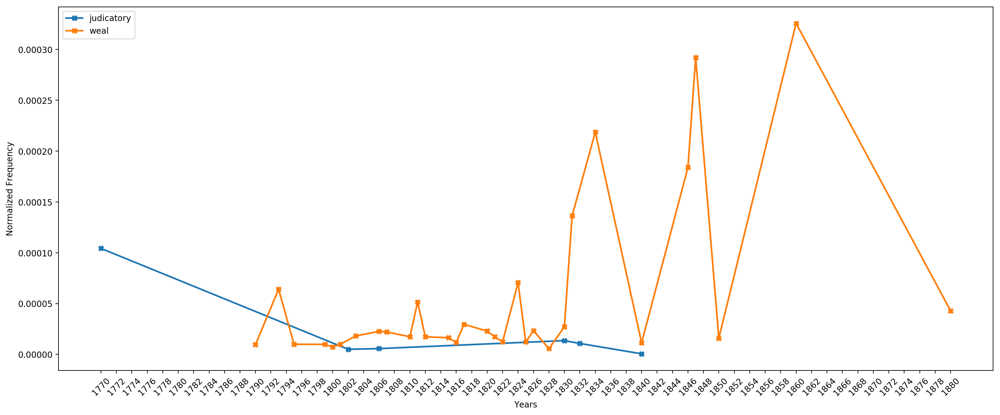

In [66]:
taxonomy_17= lexicon_norm[160:170]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_17
normalize_freq(norm_publication, freq_count_norm, taxonomy_17)

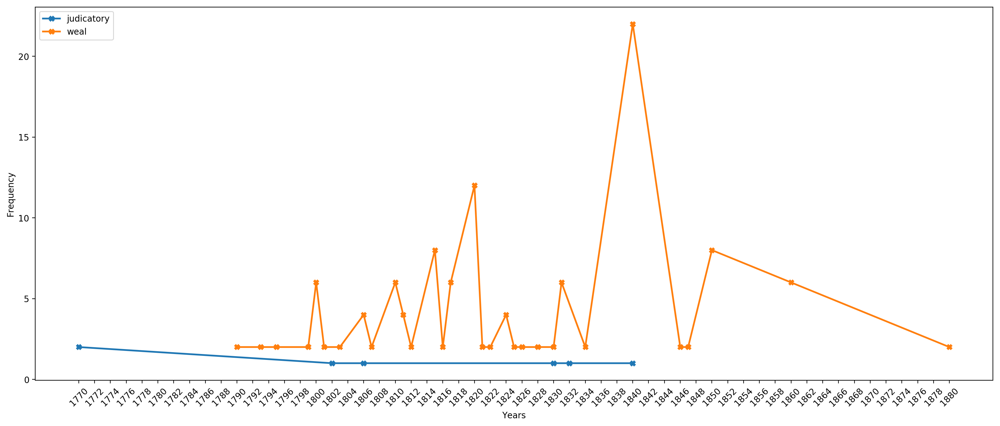

In [67]:
plot_freq_count(freq_count_norm, taxonomy_17)

#### Taxomony 18

In [68]:
print("Terms used in Taxonomy 18: %s" %(' '.join(lexicon_norm[170:180]).replace(' ', ', ')))

Terms used in Taxonomy 18: unecessaire, ingadged, ingadge, aneugh, laitlie, praejudge, thrasurie, grive, grived, praesant


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


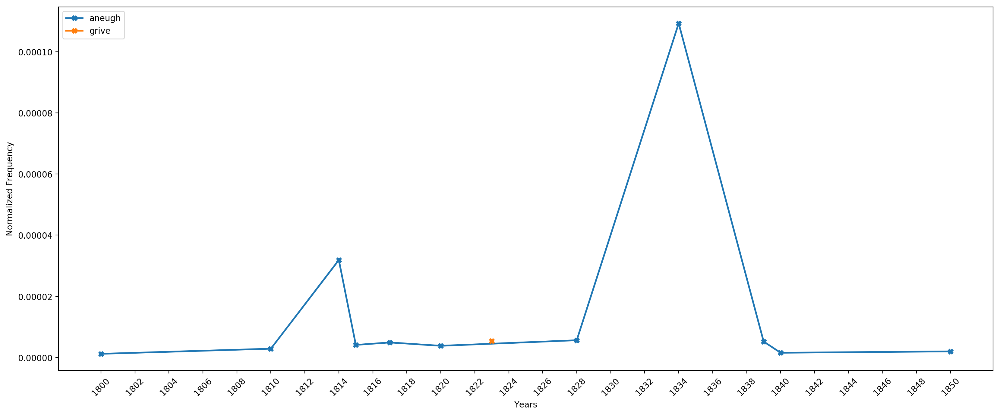

In [69]:
taxonomy_18= lexicon_norm[170:180]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_18
normalize_freq(norm_publication, freq_count_norm, taxonomy_18)

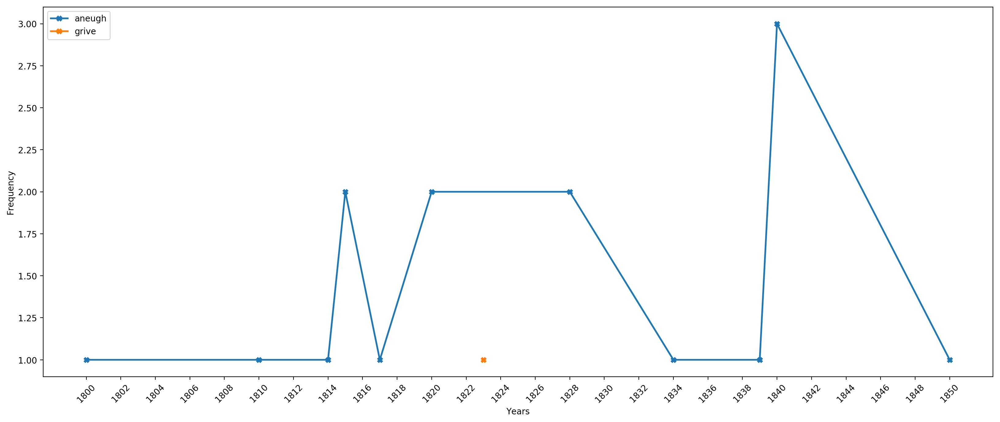

In [70]:
plot_freq_count(freq_count_norm, taxonomy_18)

#### Taxomony 19

In [71]:
print("Terms used in Taxonomy 19: %s" %(' '.join(lexicon_norm[180:190]).replace(' ', ', ')))

Terms used in Taxonomy 19: greace, gaird, hylander, hyland, blist, hender, henders, praesum, brok, mainie


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


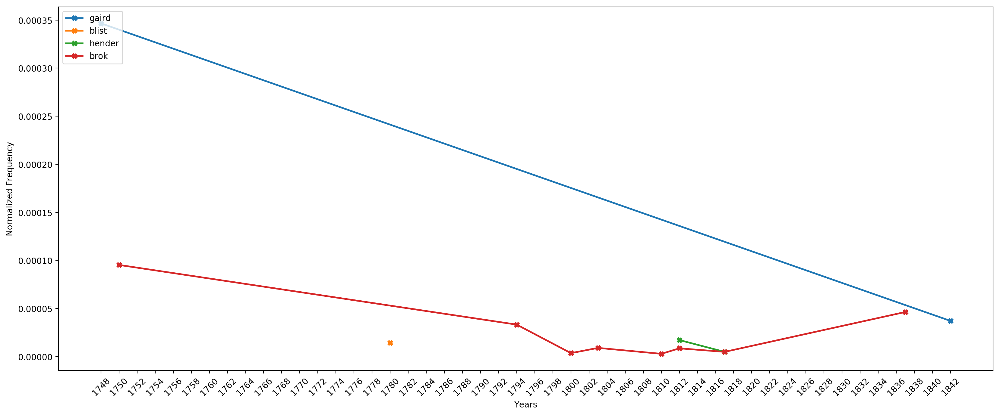

In [72]:
taxonomy_19= lexicon_norm[180:190]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_19
normalize_freq(norm_publication, freq_count_norm, taxonomy_19)

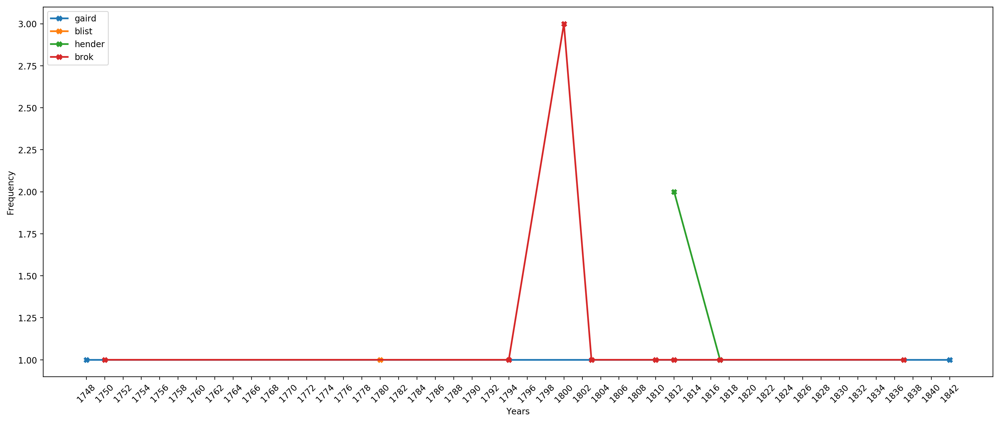

In [73]:
plot_freq_count(freq_count_norm, taxonomy_19)

#### Taxomony 20

In [74]:
print("Terms used in Taxonomy 20: %s" %(' '.join(lexicon_norm[190:200]).replace(' ', ', ')))

Terms used in Taxonomy 20: weal, cheange, cheangablness, exhousted, praejudice, cheanges, hendred, praeside, caice, glaid


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


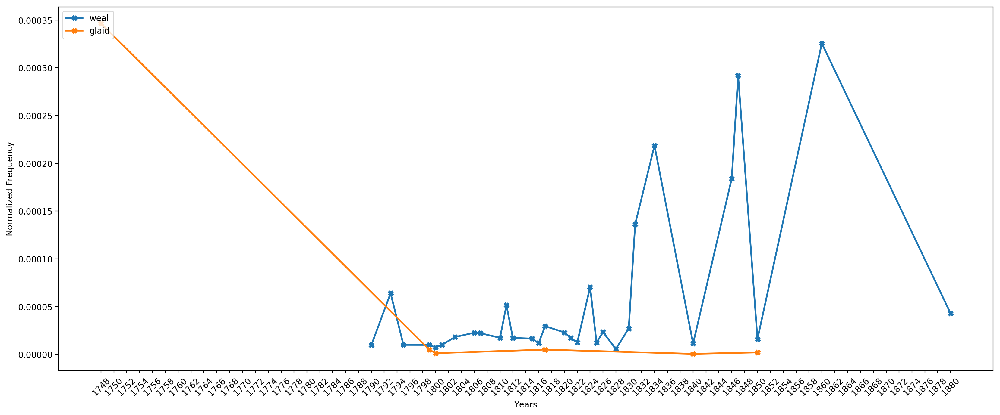

In [75]:
taxonomy_20= lexicon_norm[190:200]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_20
normalize_freq(norm_publication, freq_count_norm, taxonomy_20)

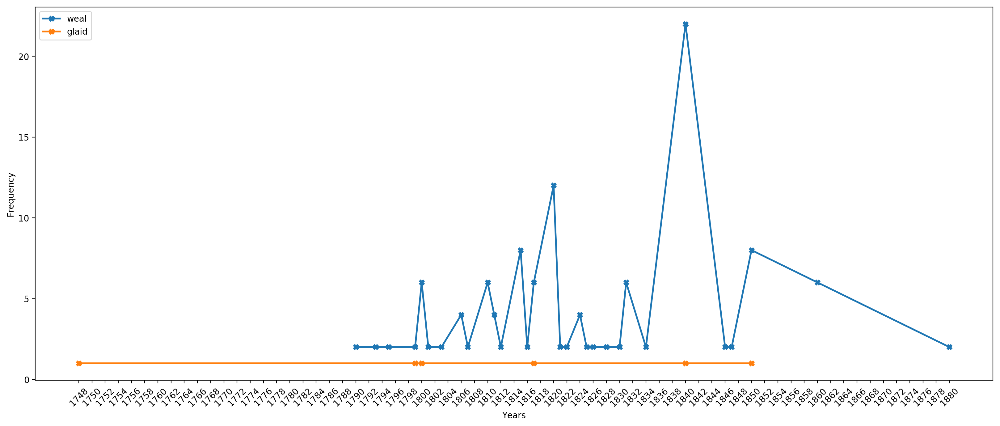

In [76]:
plot_freq_count(freq_count_norm, taxonomy_20)

#### Taxomony 21

In [77]:
print("Terms used in Taxonomy 21: %s" %(' '.join(lexicon_norm[200:210]).replace(' ', ', ')))

Terms used in Taxonomy 21: lou, praelimiting, dail, unanimuslie, prelimitation, prelimit, necessitat, adoeing, dale, rexive


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


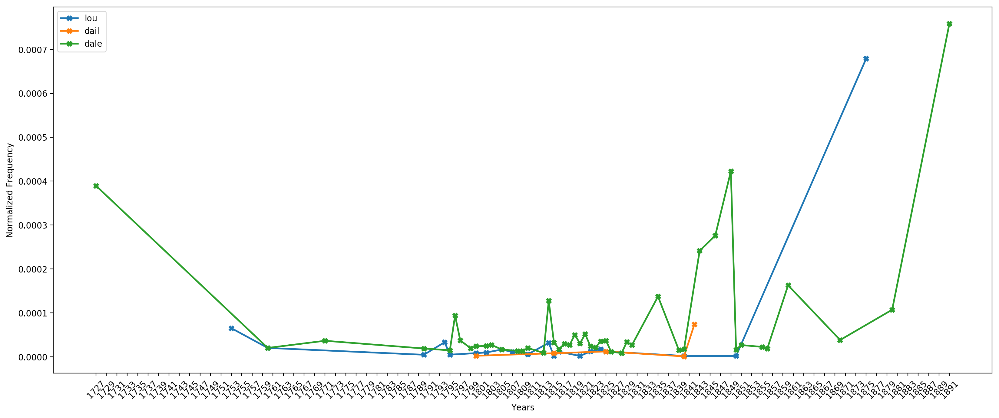

In [78]:
taxonomy_21= lexicon_norm[200:210]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_21
normalize_freq(norm_publication, freq_count_norm, taxonomy_21)

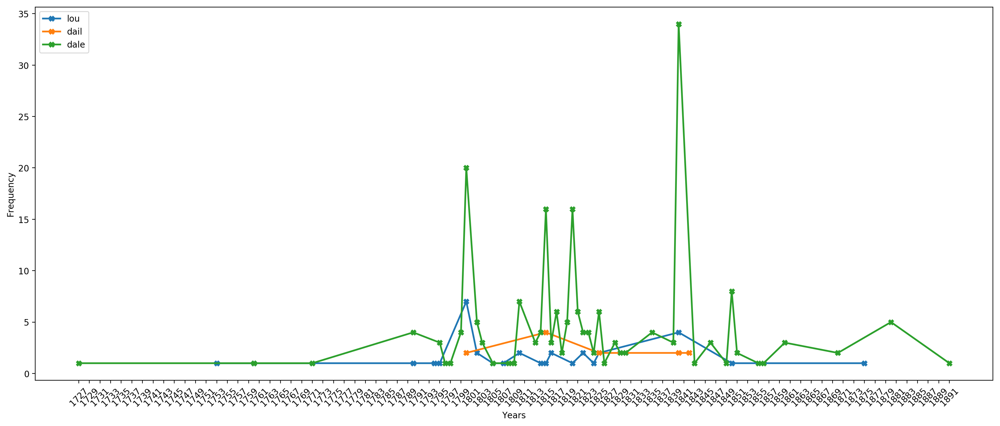

In [79]:
plot_freq_count(freq_count_norm, taxonomy_21)

#### Taxomony 22

In [80]:
print("Terms used in Taxonomy 22: %s" %(' '.join(lexicon_norm[210:220]).replace(' ', ', ')))

Terms used in Taxonomy 22: quytt, clame, ffermers, approwen, quhereby, choise, to, morou, thraesurie, esteat, cariing


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


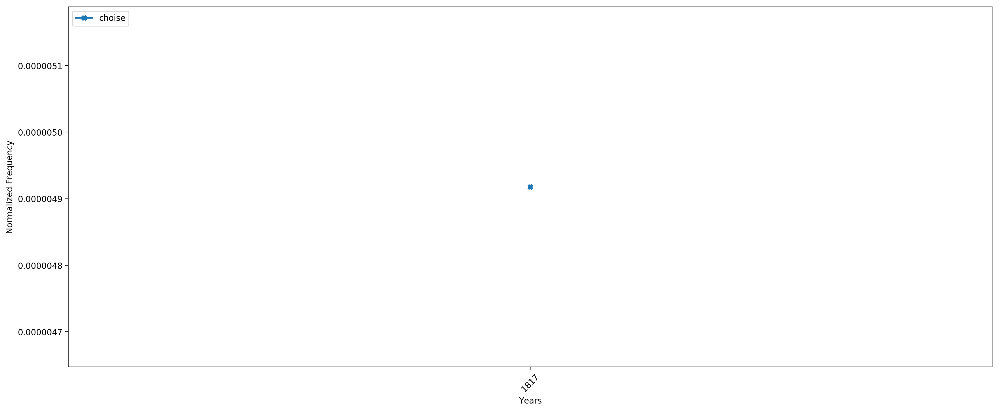

In [81]:
taxonomy_22= lexicon_norm[210:220]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_22
normalize_freq(norm_publication, freq_count_norm, taxonomy_22)

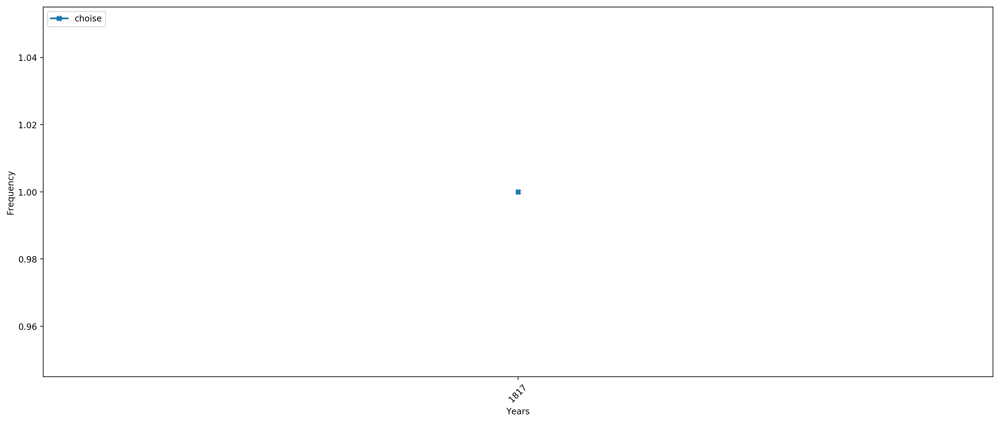

In [82]:
plot_freq_count(freq_count_norm, taxonomy_22)

#### Taxomony 23

In [83]:
print("Terms used in Taxonomy 23: %s" %(' '.join(lexicon_norm[220:230]).replace(' ', ', ')))

Terms used in Taxonomy 23: esteats, interteanment, intertean, interteanments, niu, diu, haist, spair, daile, saime


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


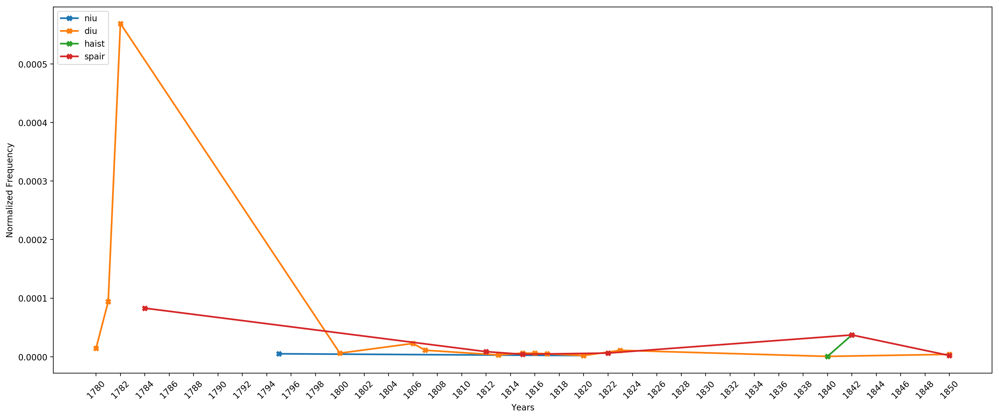

In [84]:
taxonomy_23= lexicon_norm[220:230]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_23
normalize_freq(norm_publication, freq_count_norm, taxonomy_23)

#### Taxomony 24

In [85]:
print("Terms used in Taxonomy 24: %s" %(' '.join(lexicon_norm[230:240]).replace(' ', ', ')))

Terms used in Taxonomy 24: larne, saife, saif, cabaling, repulls, verrie, haisty, therteen, suord, daited


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


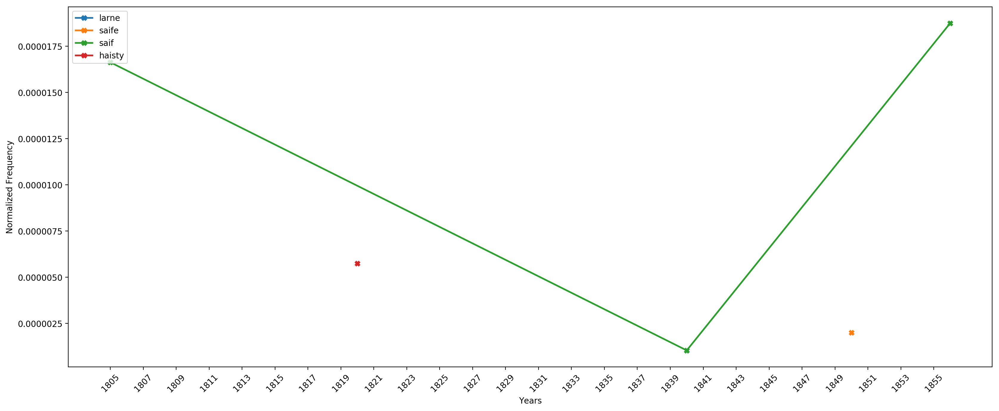

In [86]:
taxonomy_24= lexicon_norm[230:240]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_24
normalize_freq(norm_publication, freq_count_norm, taxonomy_24)

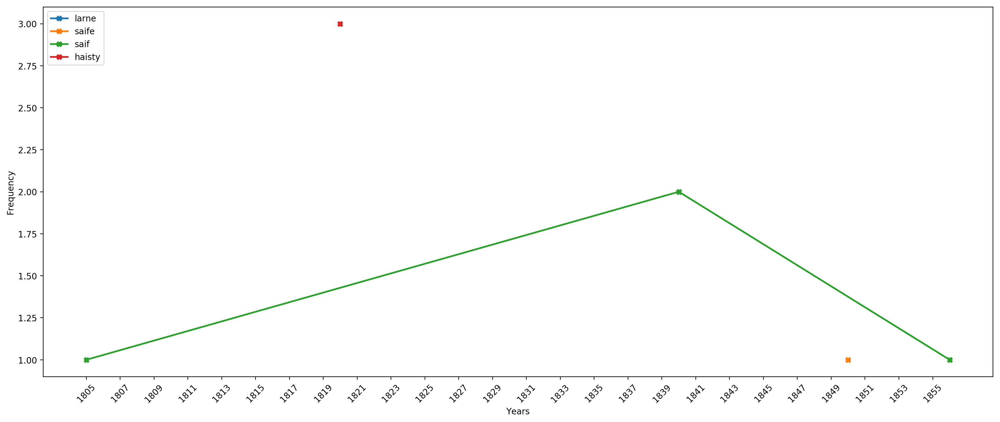

In [87]:
plot_freq_count(freq_count_norm, taxonomy_24)

#### Taxomony 25

In [88]:
print("Terms used in Taxonomy 25: %s" %(' '.join(lexicon_norm[240:250]).replace(' ', ', ')))

Terms used in Taxonomy 25: dait, vottes, votte, estaites, miet, relaite, relaites, ordinar, ether, jully


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


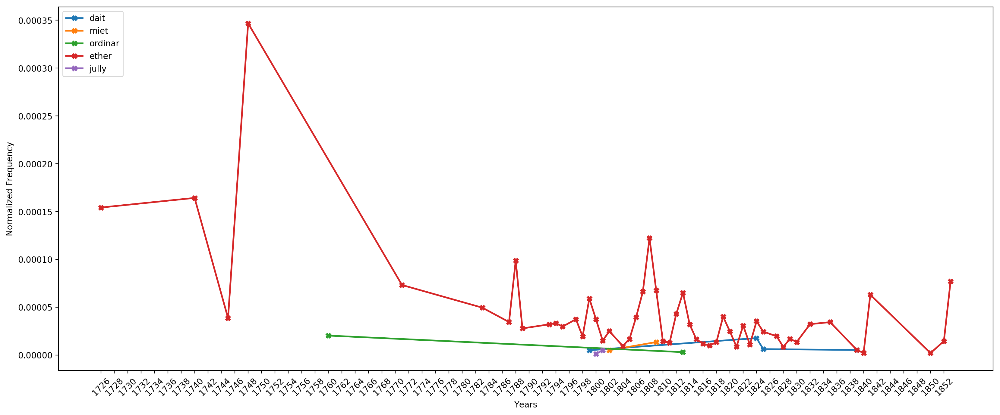

In [89]:
taxonomy_25= lexicon_norm[240:250]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_25
normalize_freq(norm_publication, freq_count_norm, taxonomy_25)

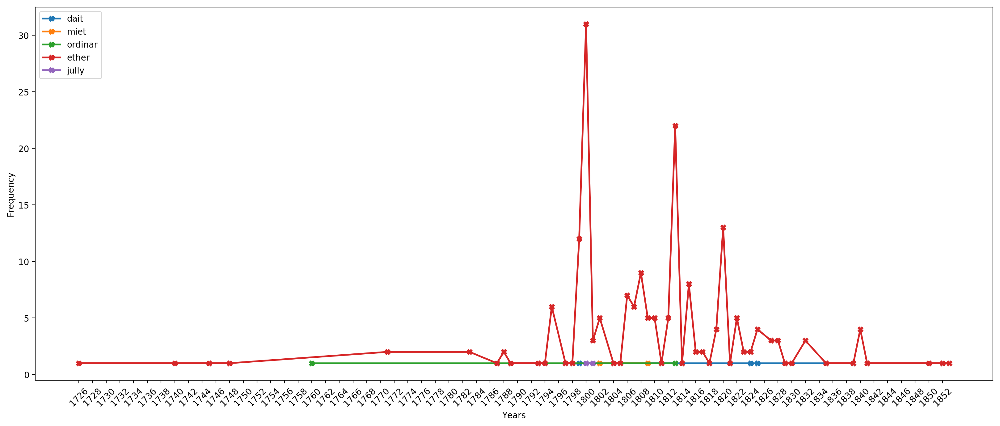

In [90]:
plot_freq_count(freq_count_norm, taxonomy_25)

#### Taxomony 26

In [91]:
print("Terms used in Taxonomy 26: %s" %(' '.join(lexicon_norm[250:260]).replace(' ', ', ')))

Terms used in Taxonomy 26: commissariat, obteaning, obteaned, obteane, acquent, juin, juine, hir, continowance, continow


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


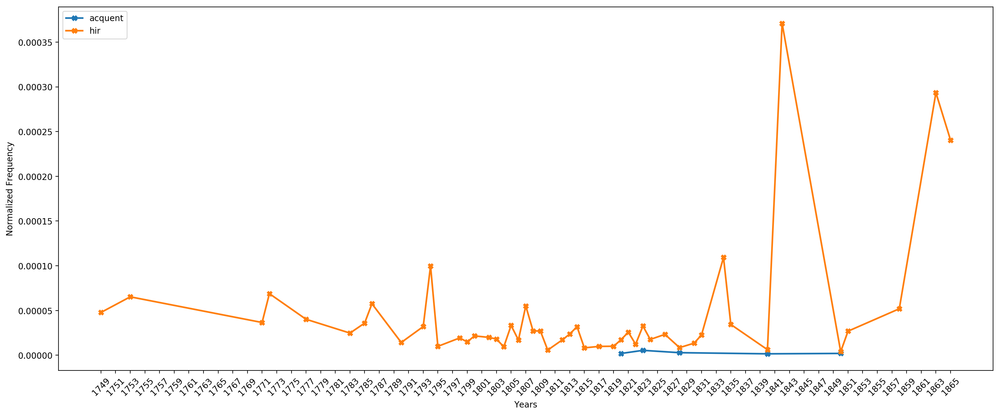

In [92]:
taxonomy_26= lexicon_norm[250:260]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_26
normalize_freq(norm_publication, freq_count_norm, taxonomy_26)

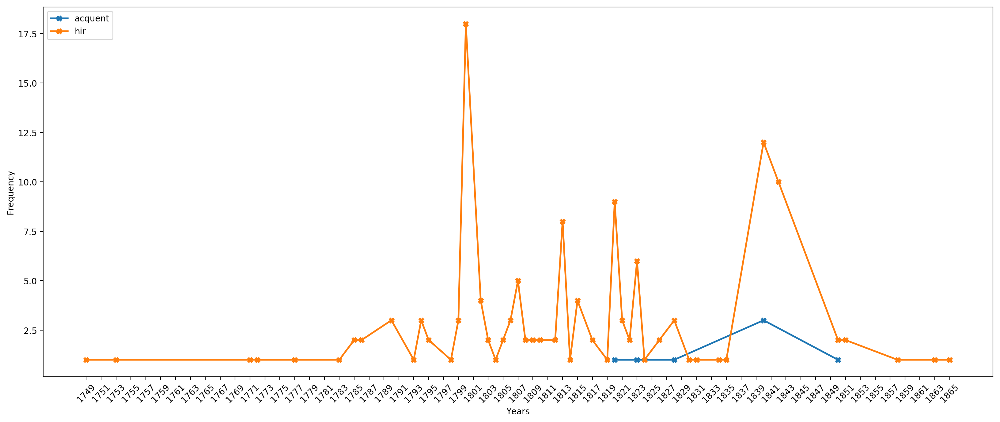

In [93]:
plot_freq_count(freq_count_norm, taxonomy_26)

#### Taxomony 27

In [94]:
print("Terms used in Taxonomy 27: %s" %(' '.join(lexicon_norm[260:270]).replace(' ', ', ')))

Terms used in Taxonomy 27: sume, lykewayes, continow, dischairge, cane, contraire, debait, pairting, pairty, subscrive


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


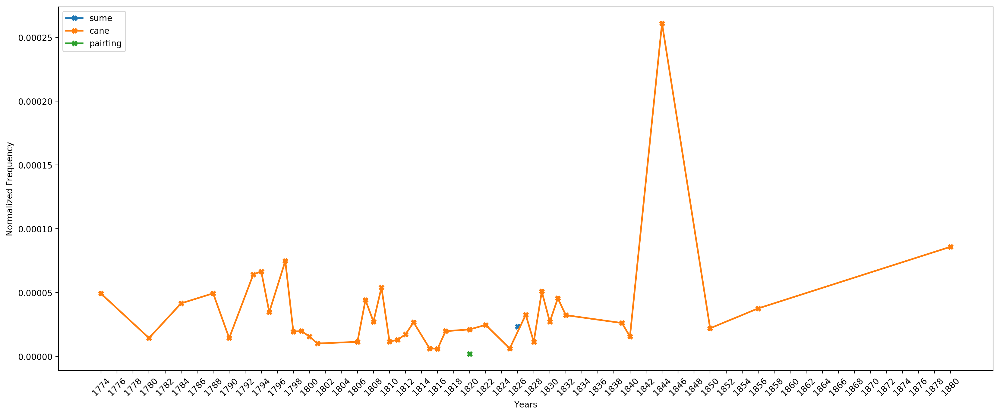

In [95]:
taxonomy_27= lexicon_norm[260:270]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_27
normalize_freq(norm_publication, freq_count_norm, taxonomy_27)

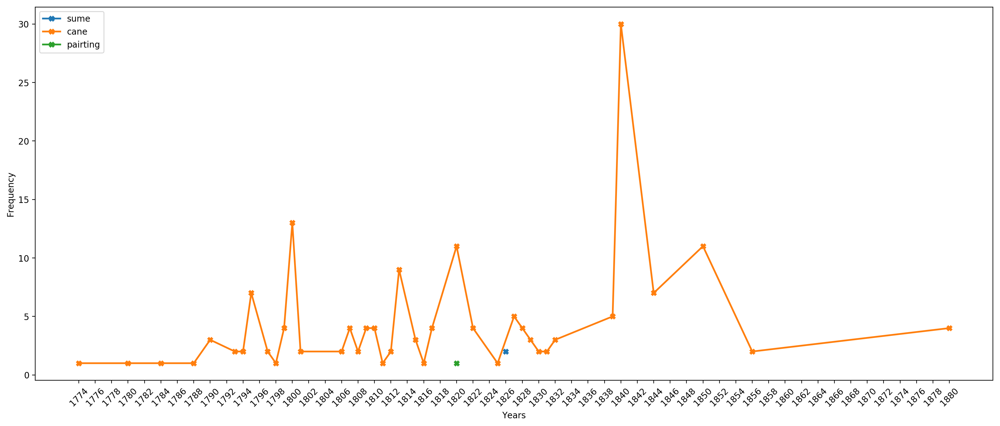

In [96]:
plot_freq_count(freq_count_norm, taxonomy_27)

#### Taxomony 28

In [97]:
print("Terms used in Taxonomy 28: %s" %(' '.join(lexicon_norm[270:]).replace(' ', ', ')))

Terms used in Taxonomy 28: subscrives, justiciorie, lauer, prorogation, poure, naruly, lykways, weell


/anaconda3/envs/mypython3/lib/python3.7/site-packages/ipykernel_launcher.py:3: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  This is separate from the ipykernel package so we can avoid doing imports until


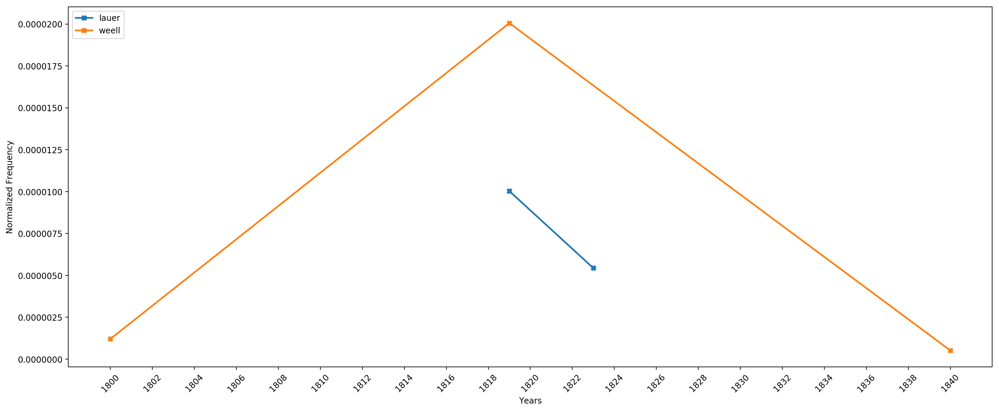

In [98]:
taxonomy_28= lexicon_norm[270:]

query_results=read_query_results('frequency_scots_per_year_count_term')
freq_count_norm=freq_count(query_results)

# Visualizing the normalized frequencies of taxomomy_28
normalize_freq(norm_publication, freq_count_norm, taxonomy_28)

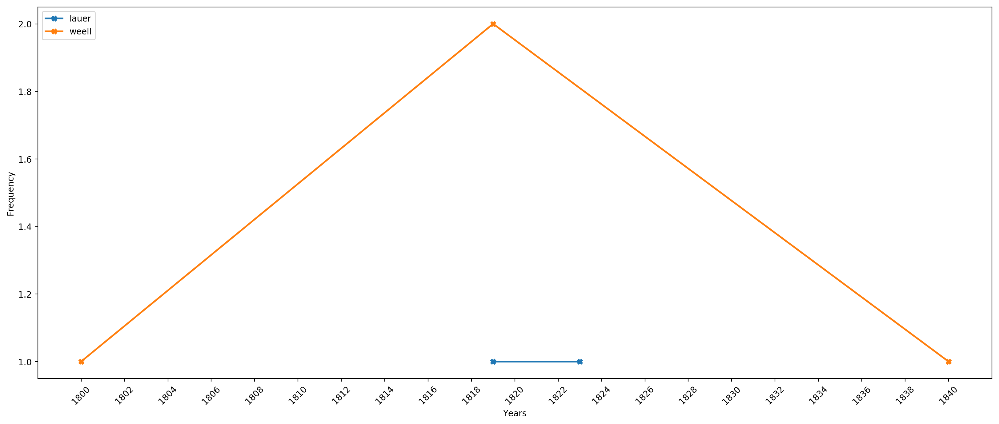

In [99]:
plot_freq_count(freq_count_norm, taxonomy_28)